TensorFlow: <module 'tensorflow._api.v2.version' from '/usr/local/lib/python3.12/dist-packages/tensorflow/_api/v2/version/__init__.py'>
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
🧪 Using Olivetti faces fallback (+ synthetic binary attribute)...
Samples: 400 | Batch: 30 | Steps/Epoch: 13

🚀 Training...
[Epoch 001/650] D: 1.2024 | G: 1.1499 | elapsed: 5.0s


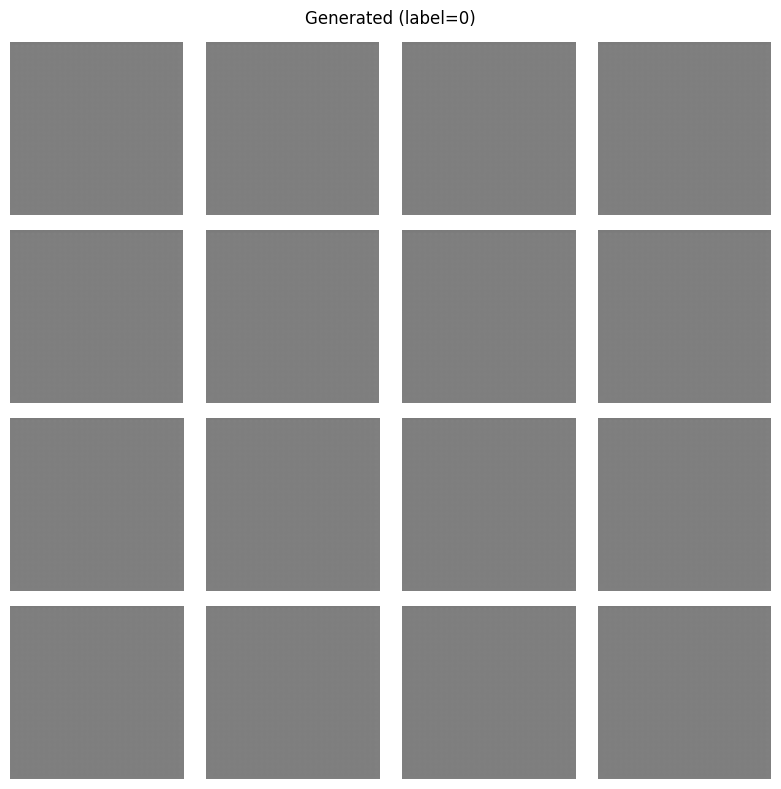

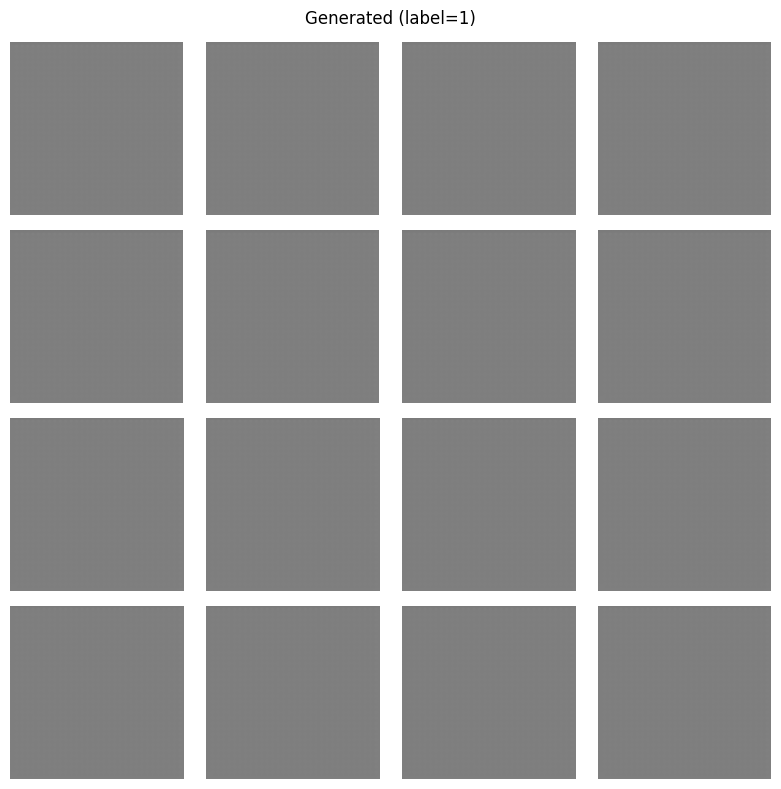

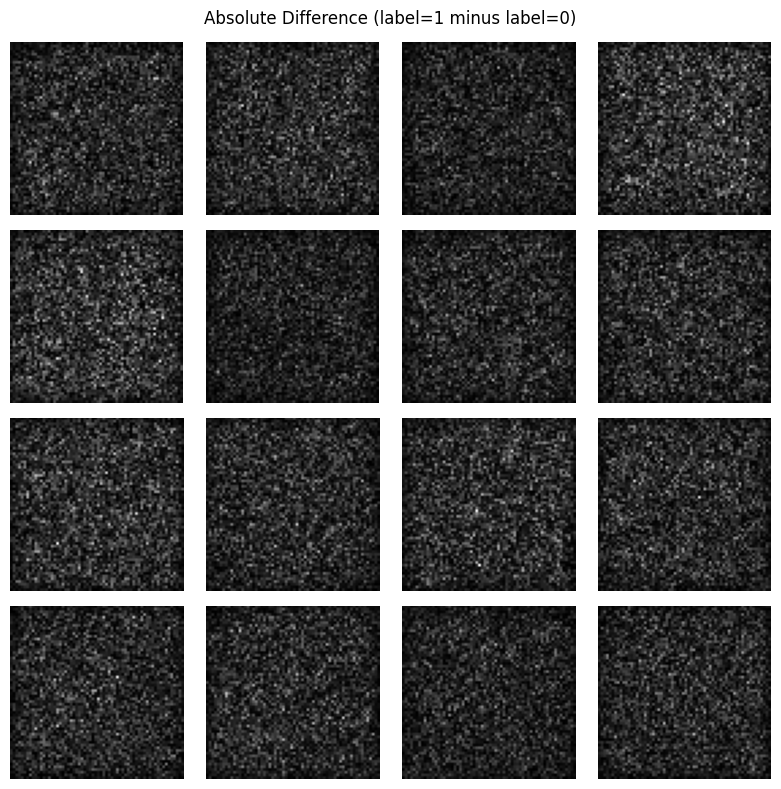

[Epoch 002/650] D: 0.7459 | G: 2.3284 | elapsed: 7.2s


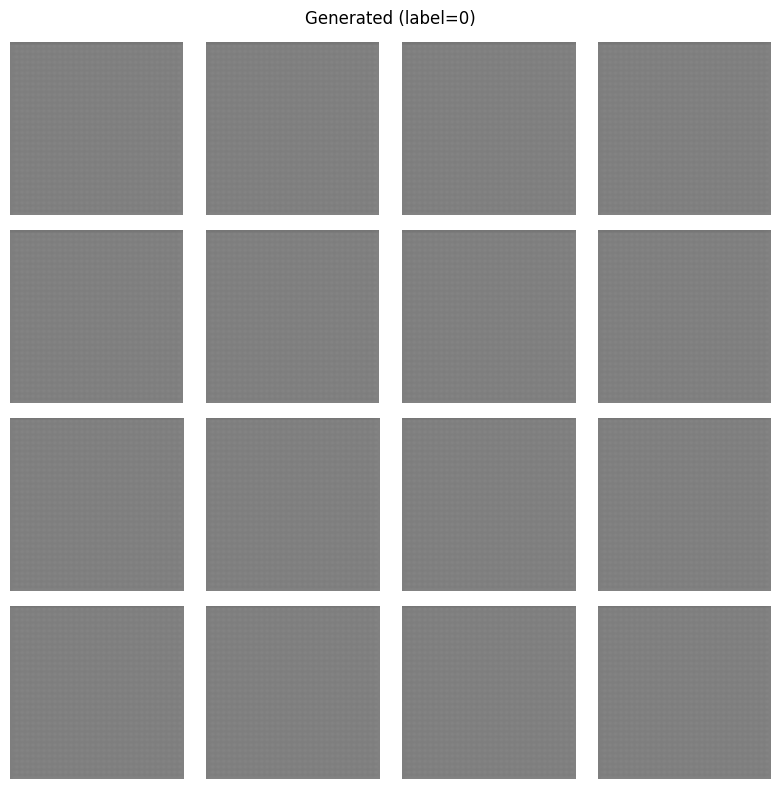

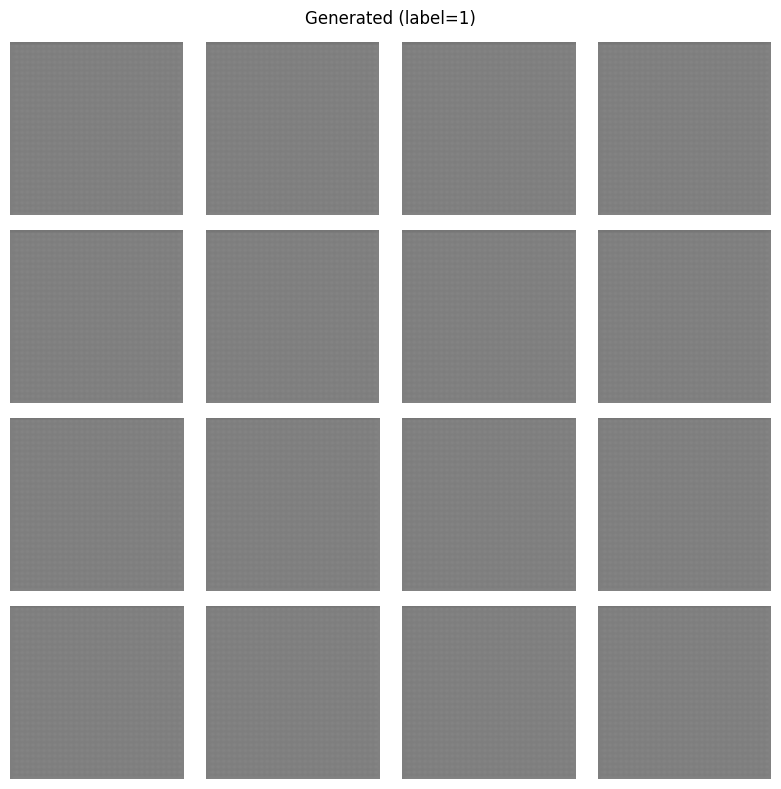

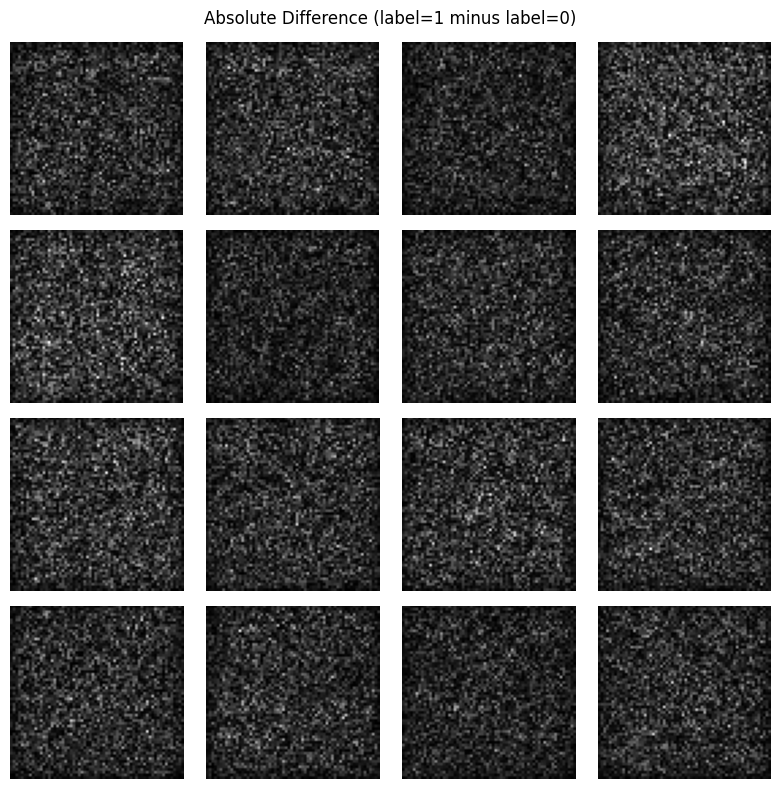

[Epoch 003/650] D: 0.8244 | G: 2.5053 | elapsed: 9.9s


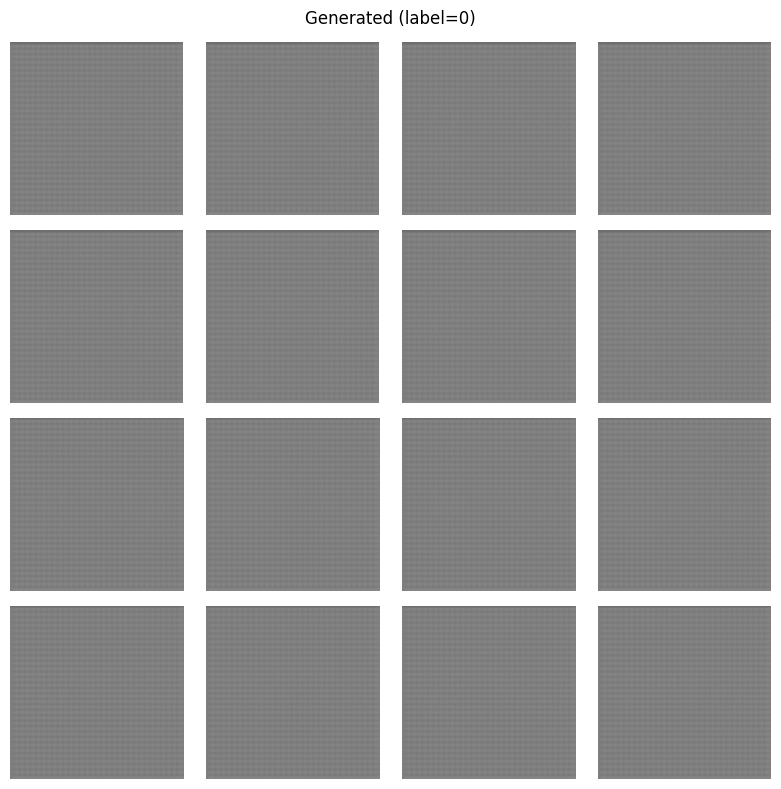

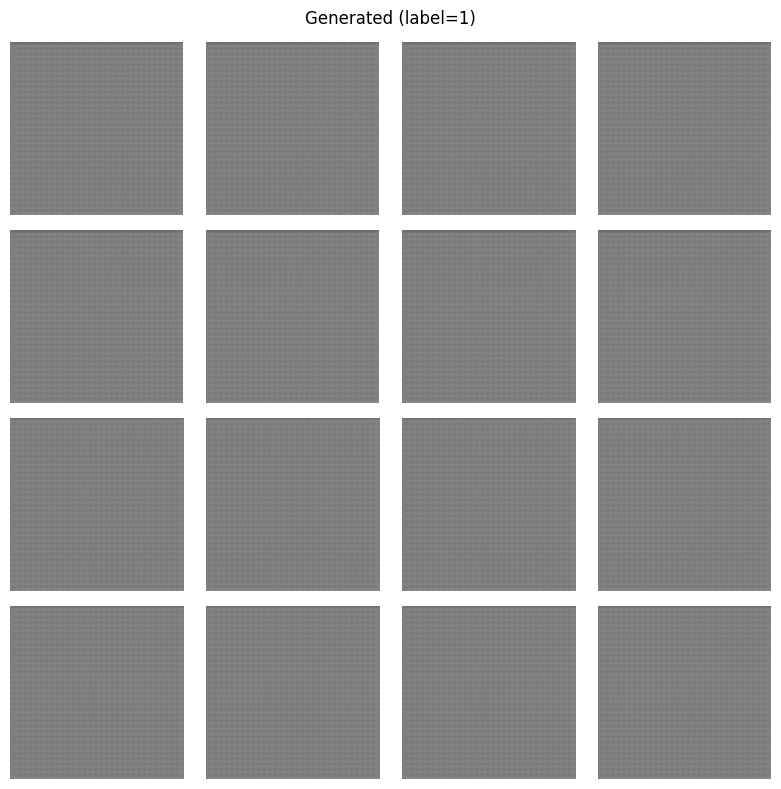

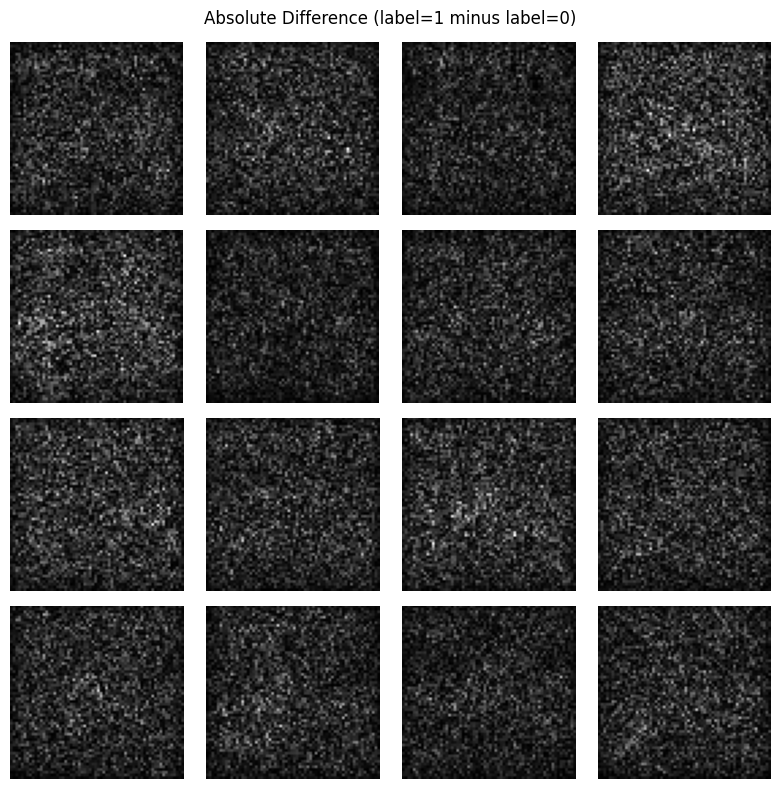

[Epoch 065/650] D: 1.2791 | G: 0.8466 | elapsed: 53.4s


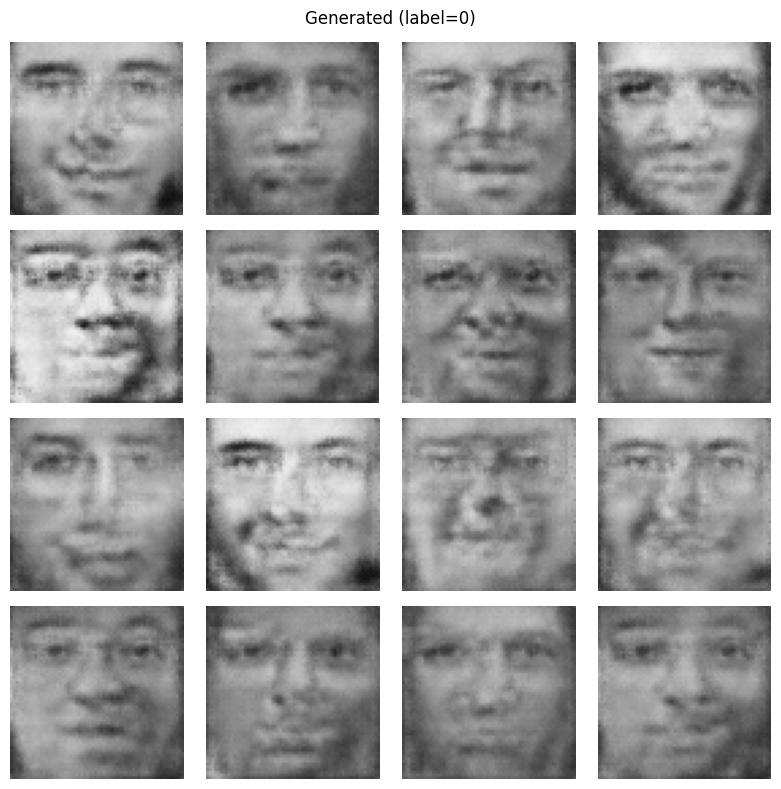

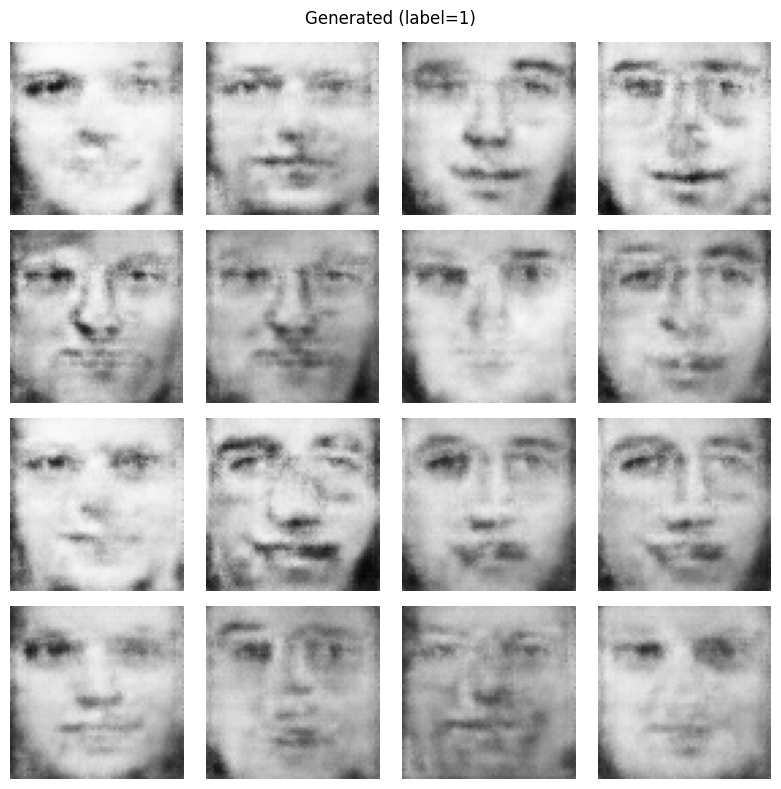

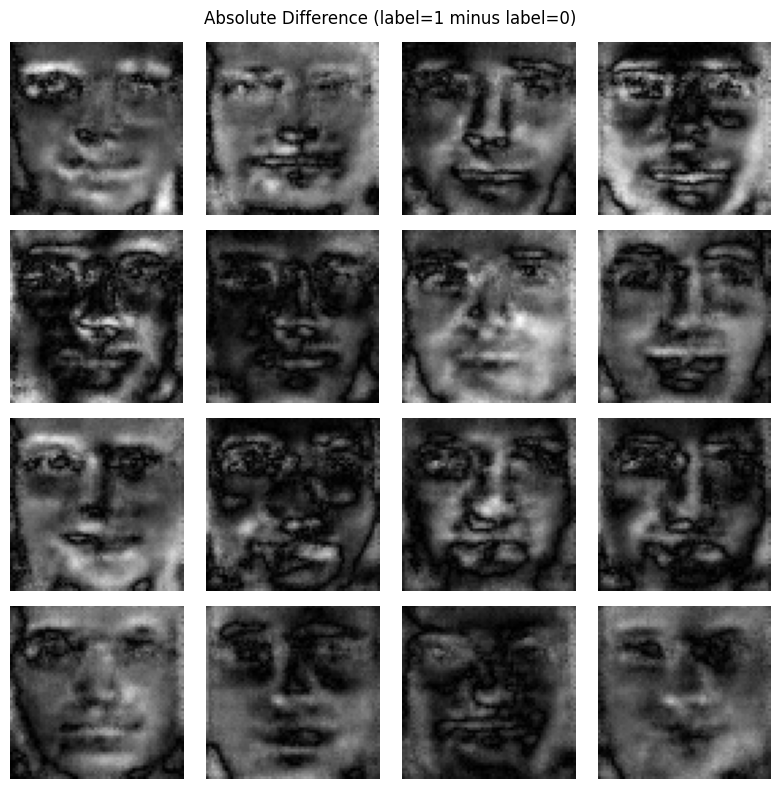

[Epoch 130/650] D: 1.1655 | G: 0.9873 | elapsed: 96.3s


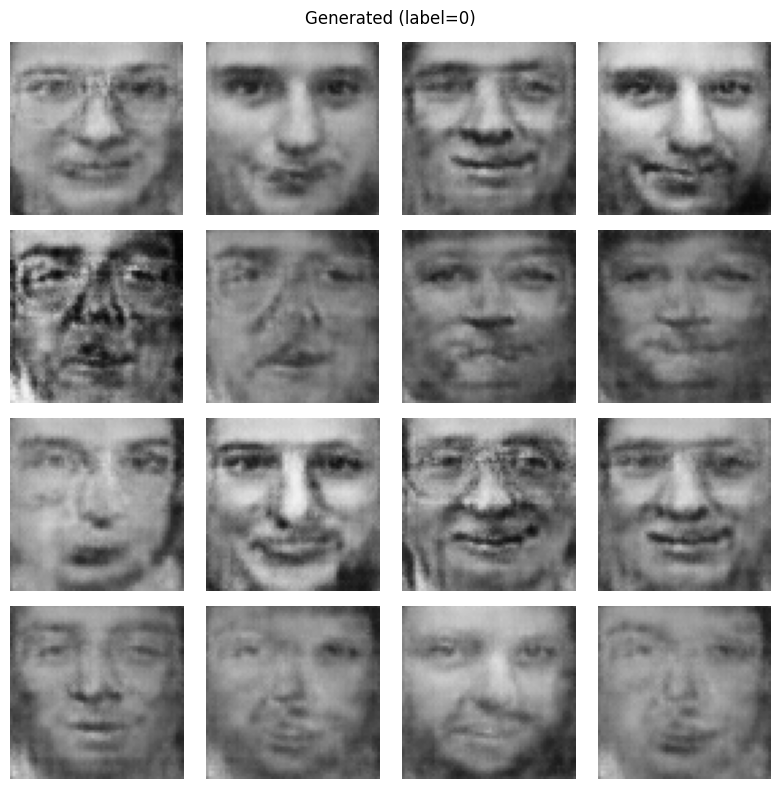

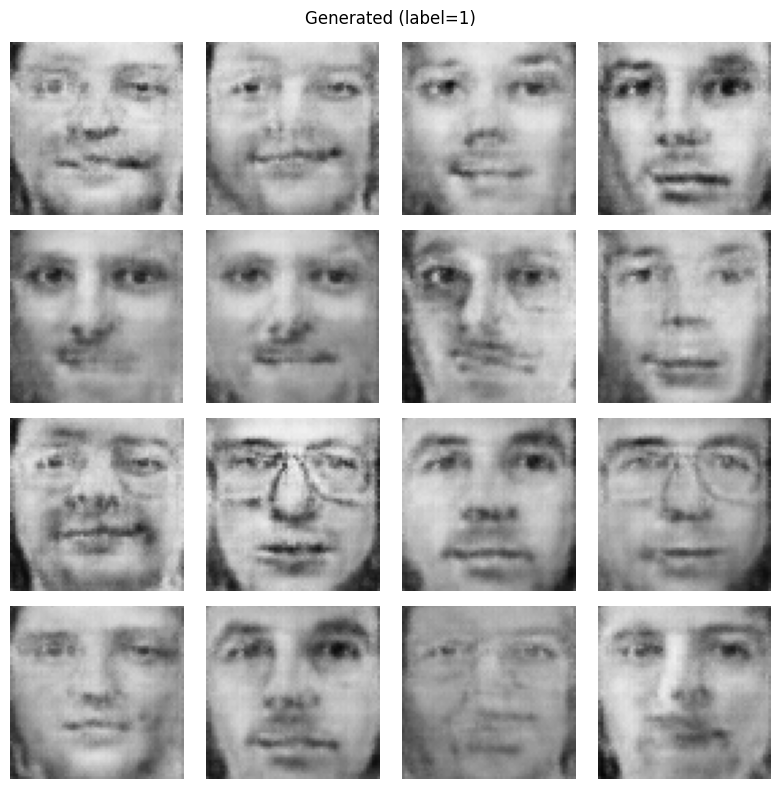

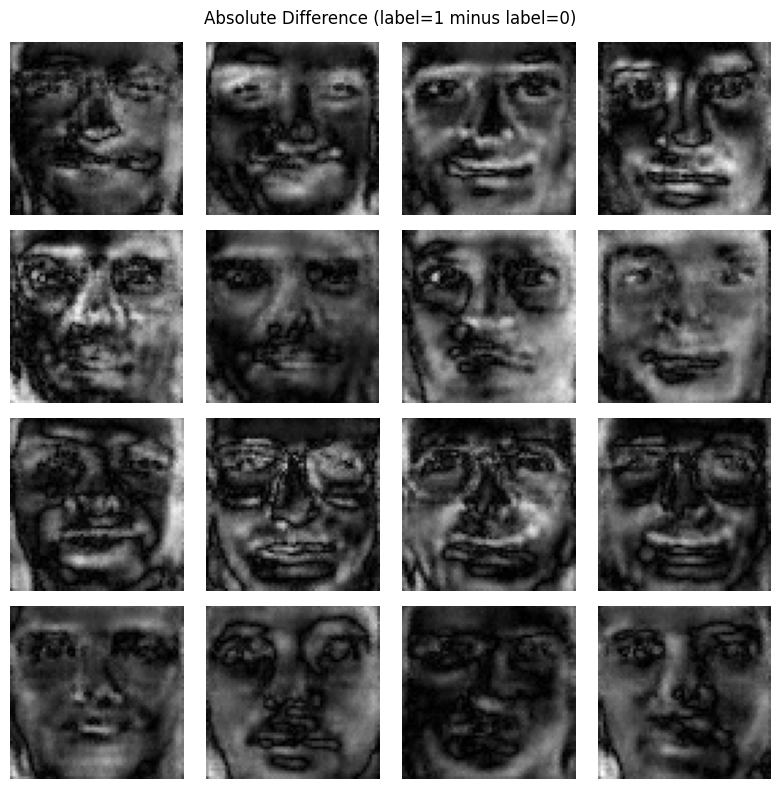

[Epoch 195/650] D: 1.0288 | G: 1.2167 | elapsed: 141.0s


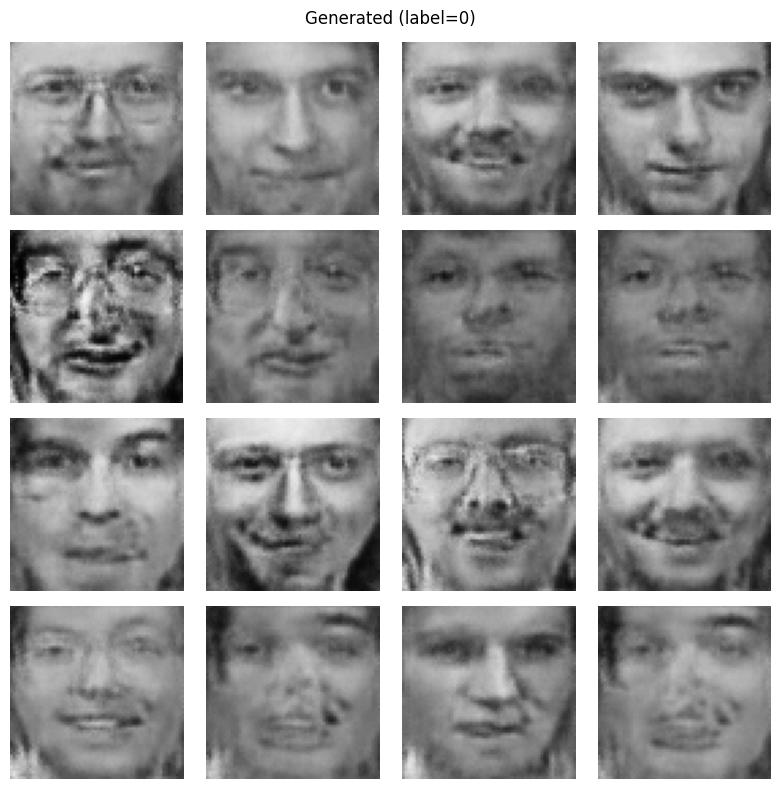

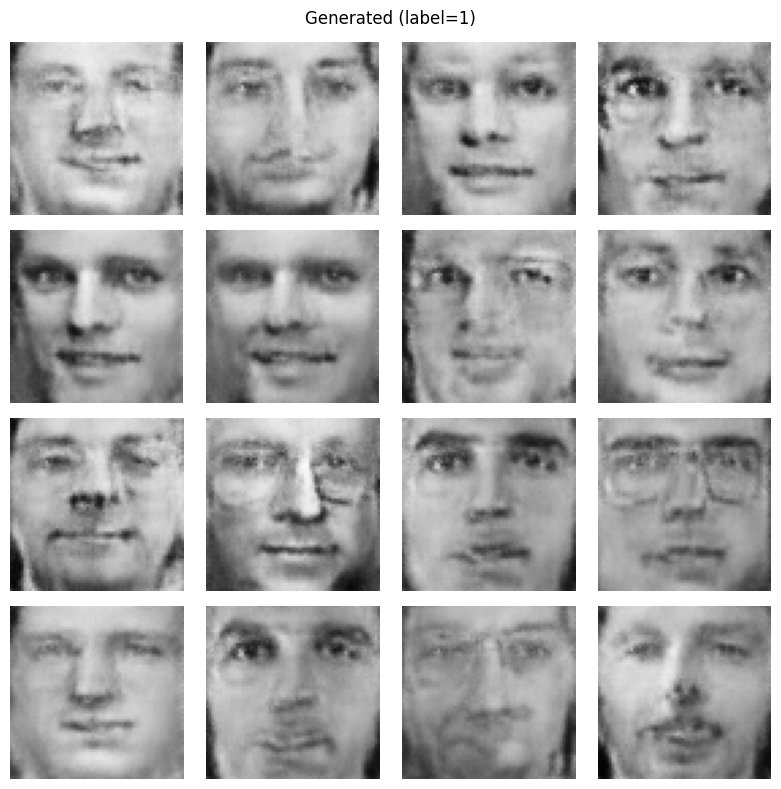

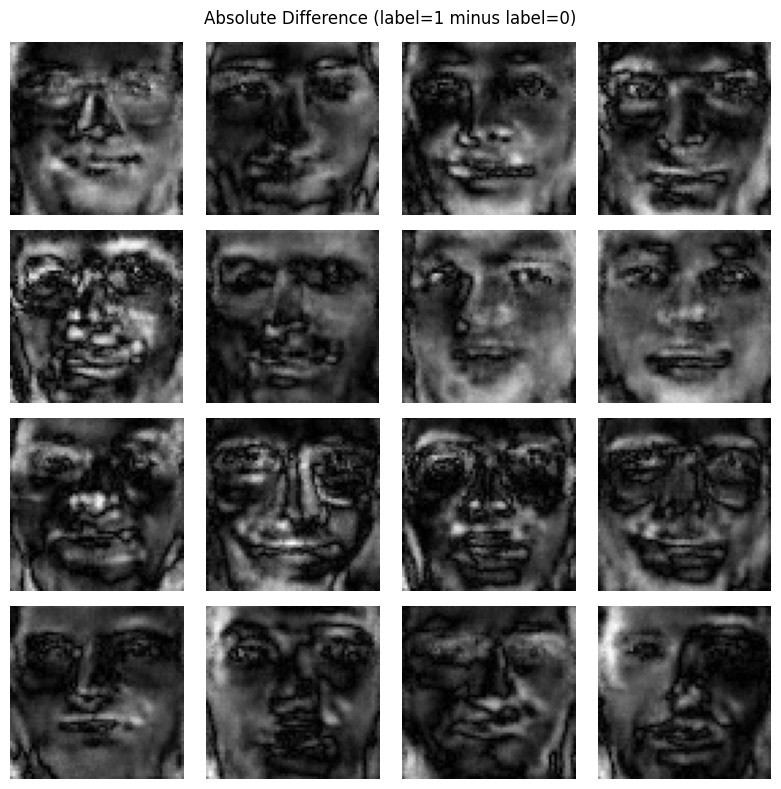

[Epoch 260/650] D: 0.9035 | G: 1.5589 | elapsed: 183.3s


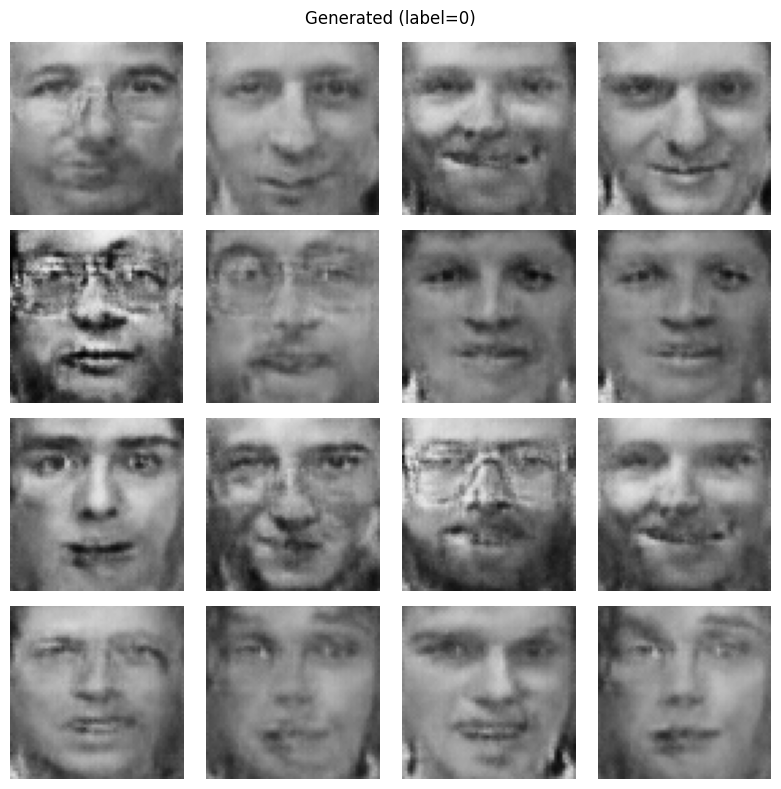

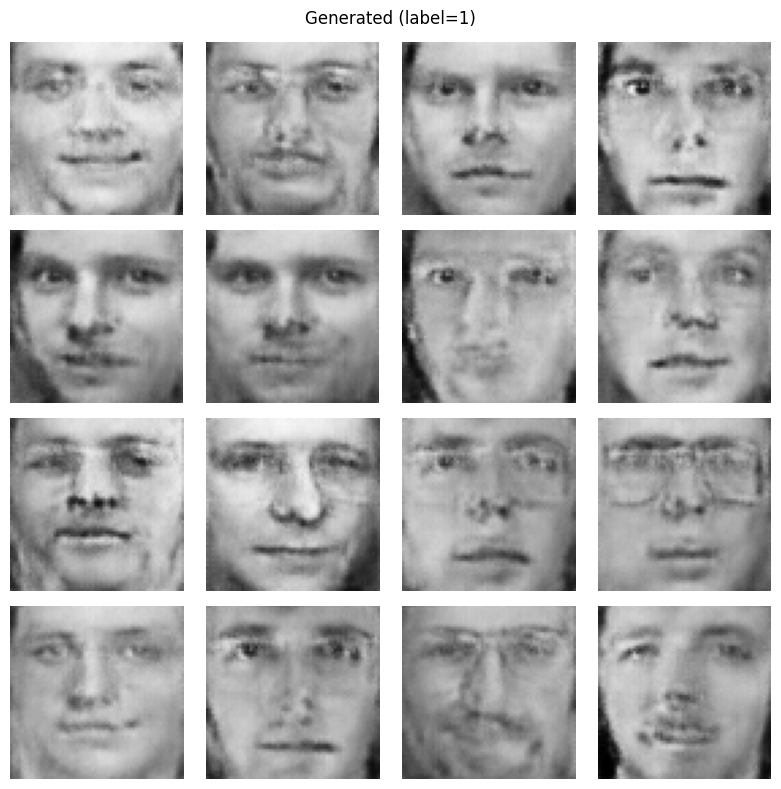

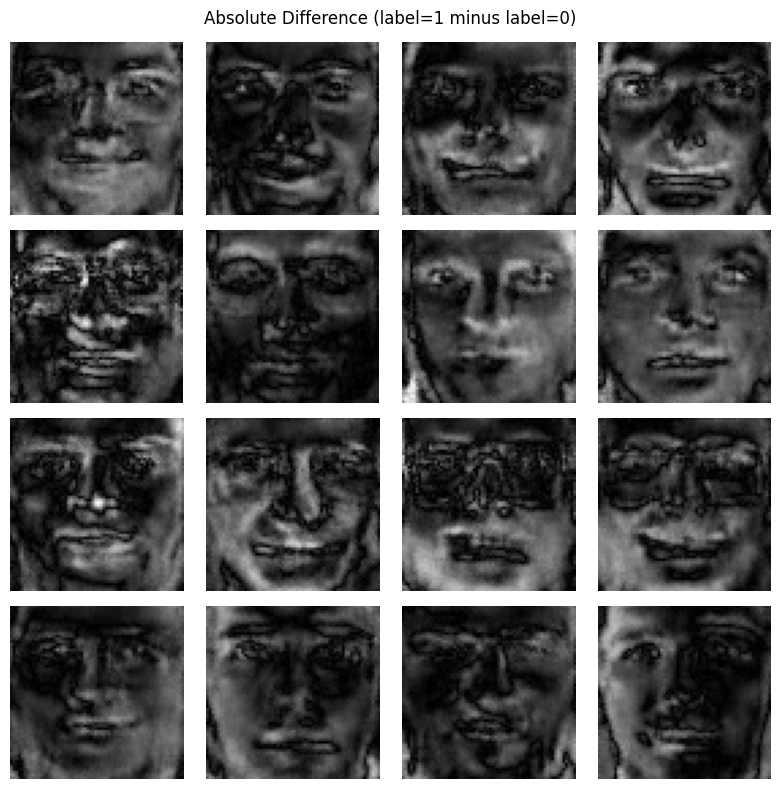

[Epoch 325/650] D: 0.8437 | G: 1.7394 | elapsed: 230.9s


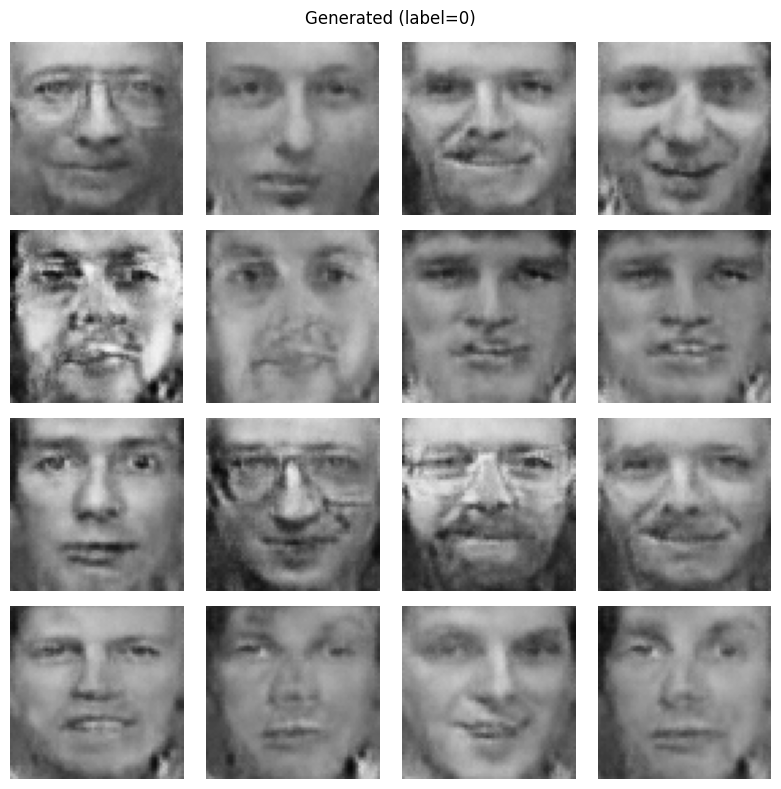

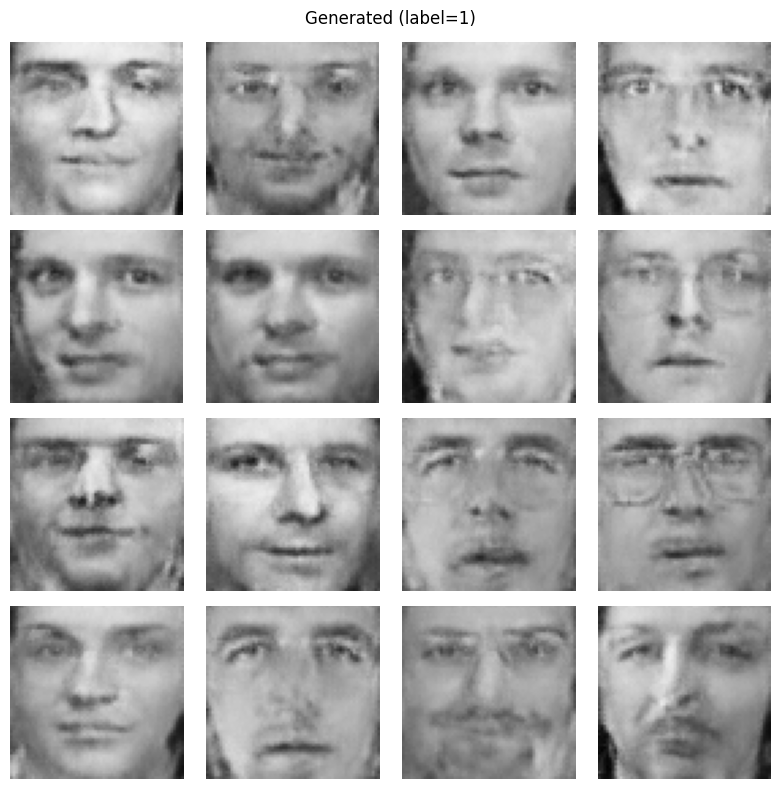

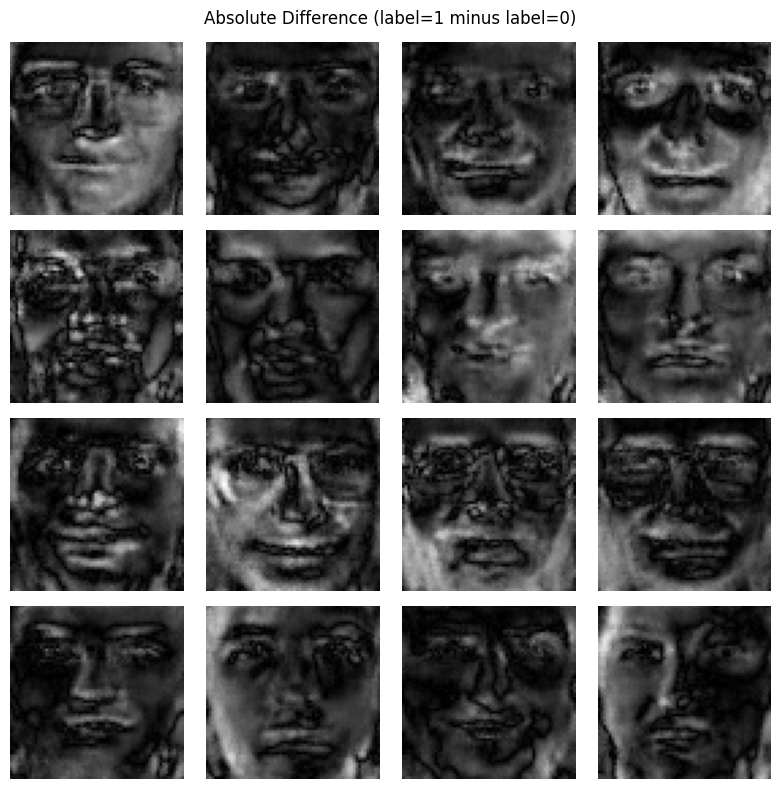

[Epoch 390/650] D: 0.7945 | G: 1.9665 | elapsed: 275.9s


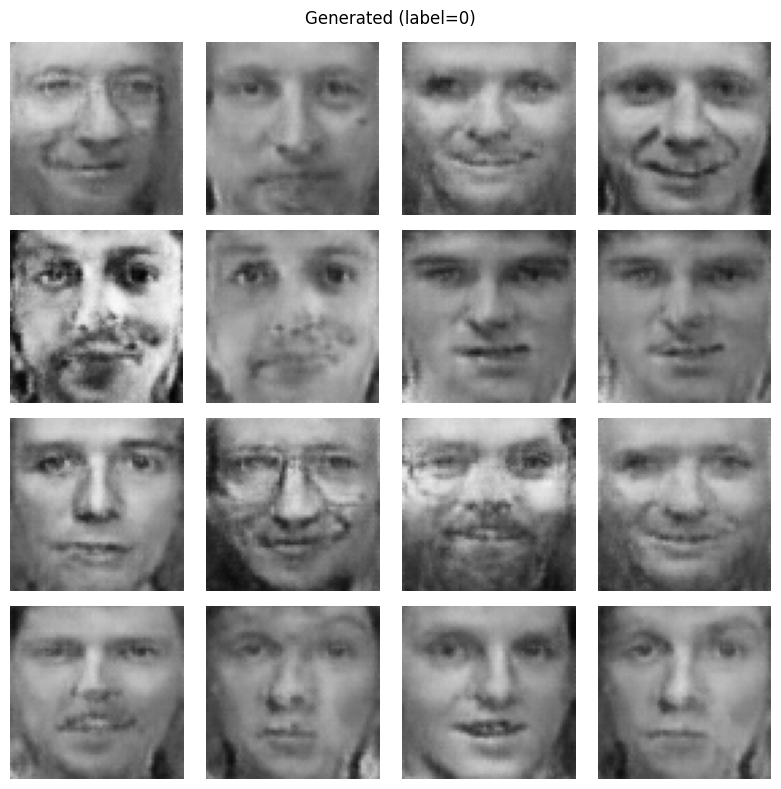

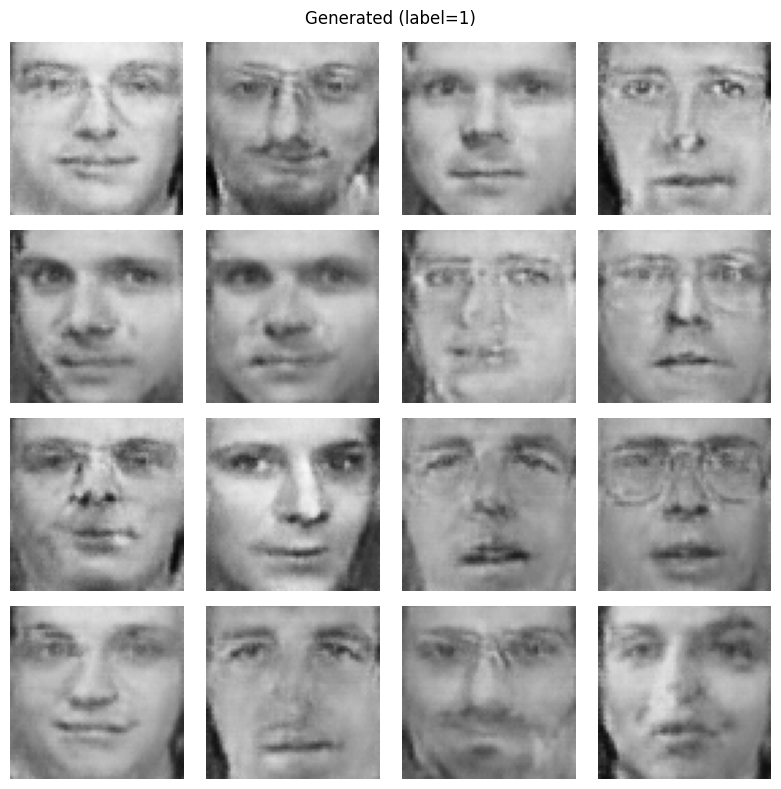

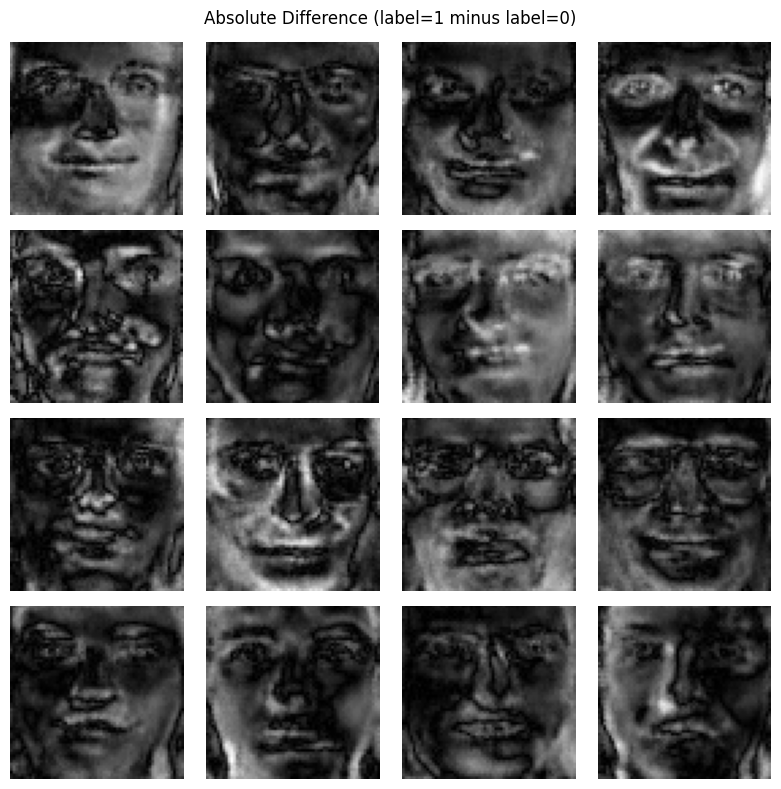

[Epoch 455/650] D: 0.7646 | G: 2.0709 | elapsed: 319.3s


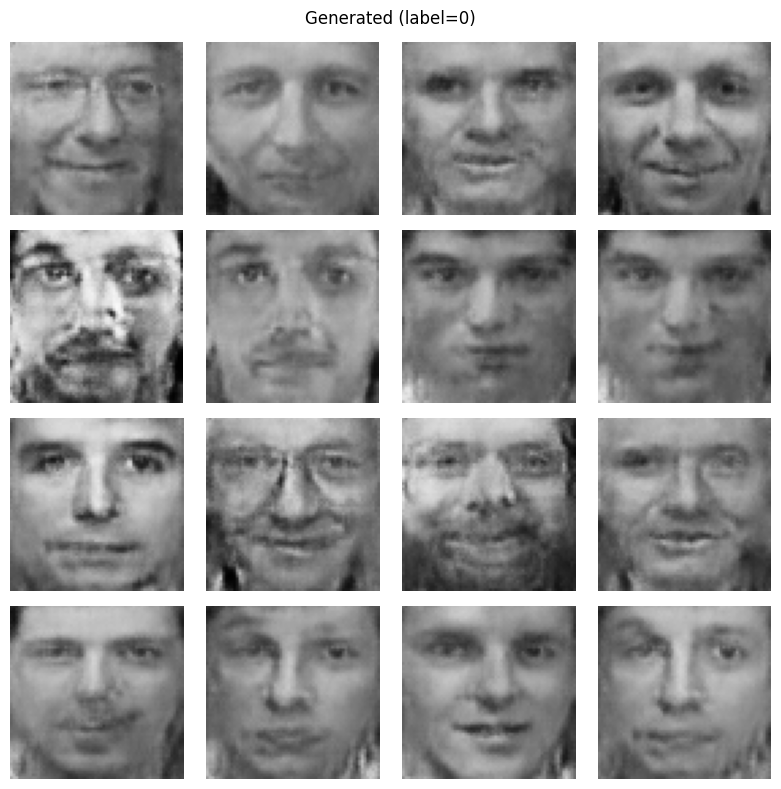

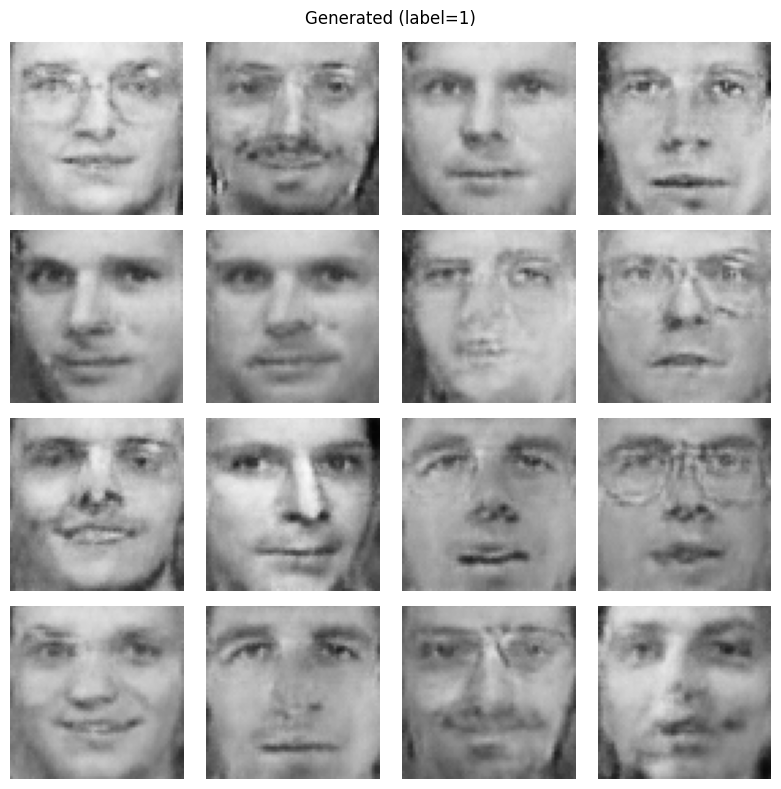

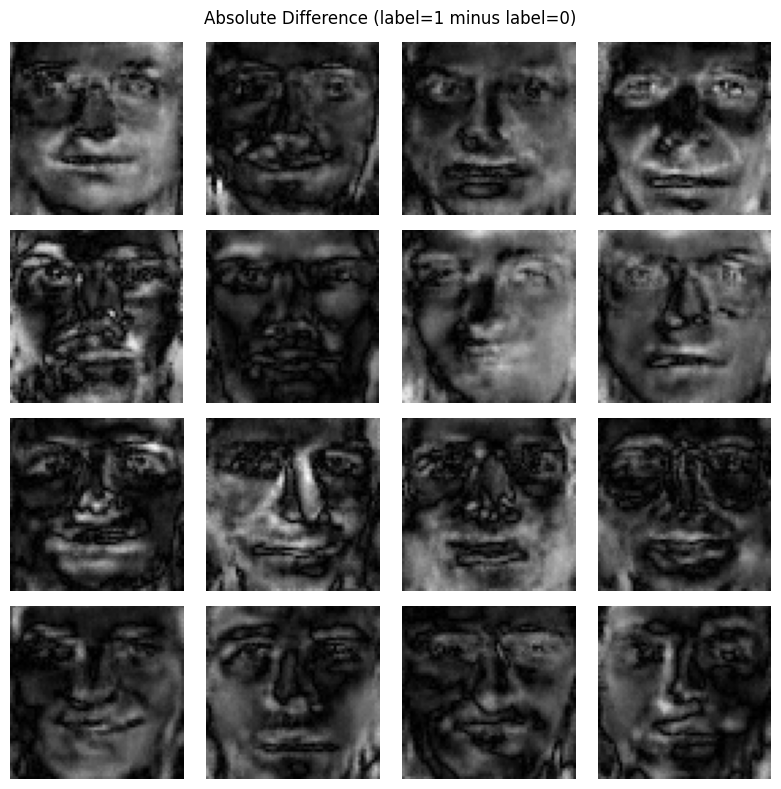

[Epoch 520/650] D: 0.7608 | G: 2.1267 | elapsed: 361.7s


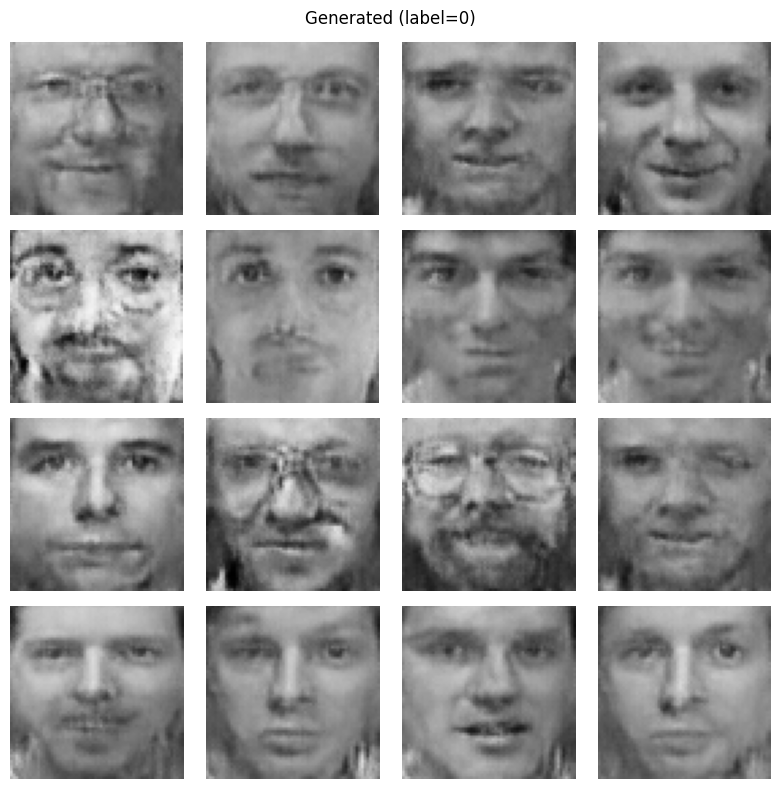

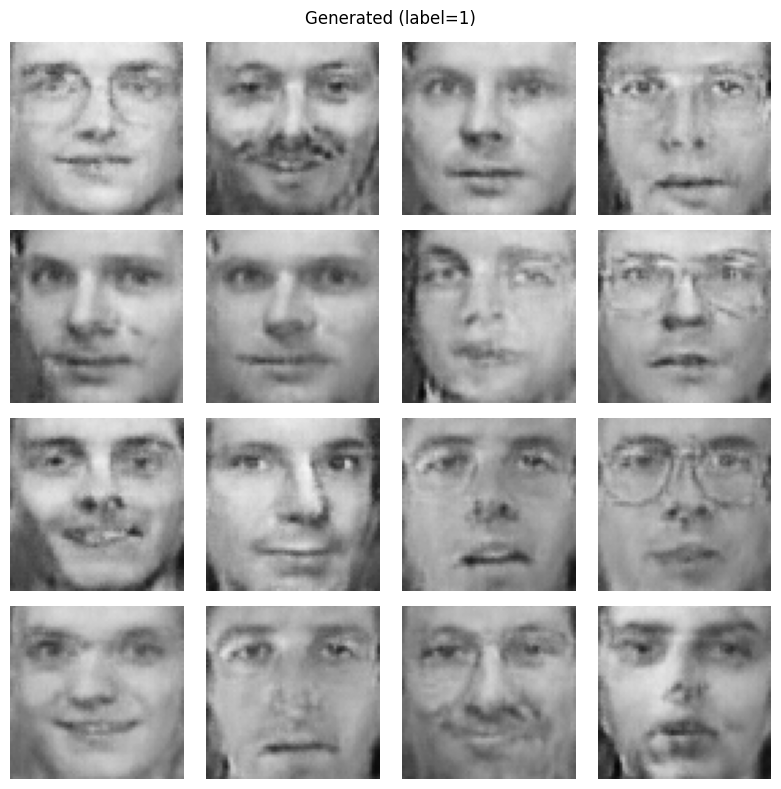

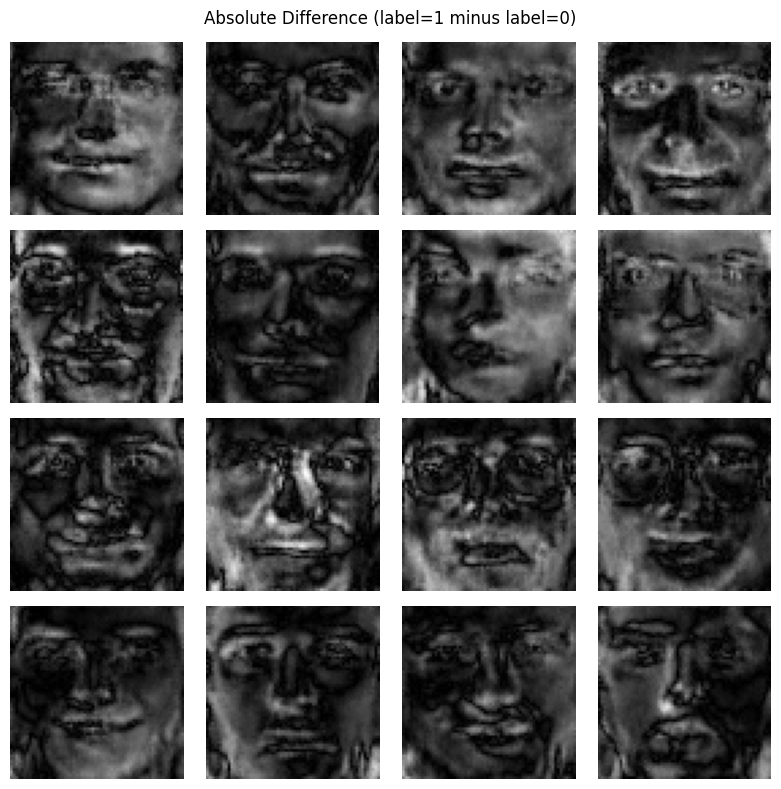

[Epoch 585/650] D: 0.7428 | G: 2.1752 | elapsed: 405.2s


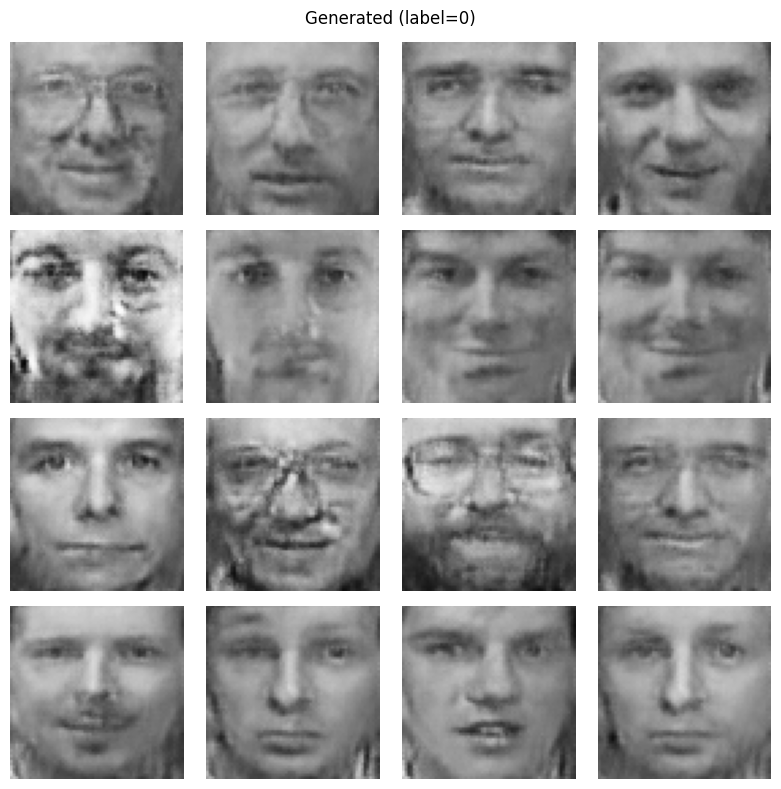

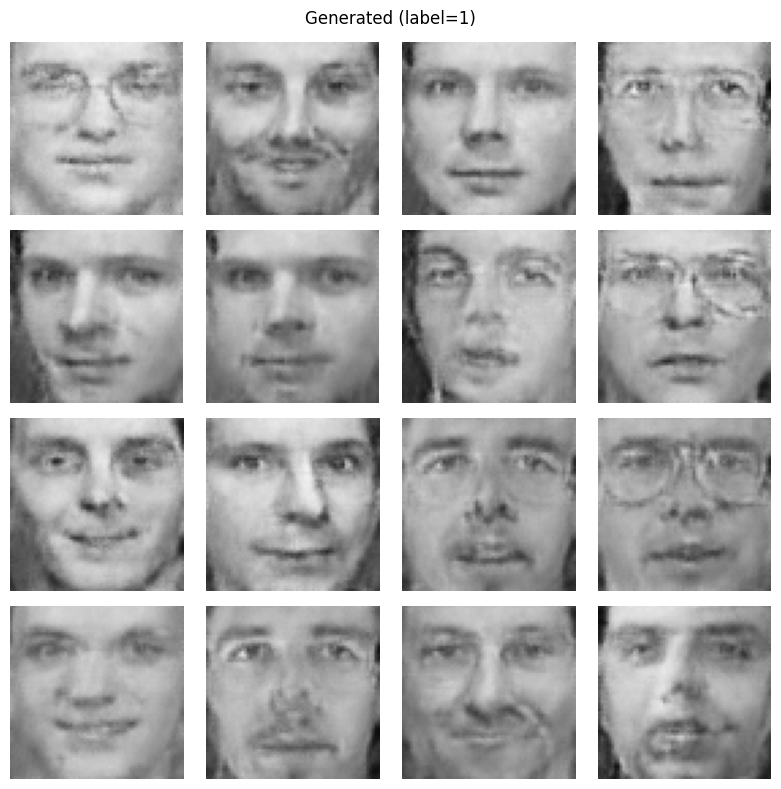

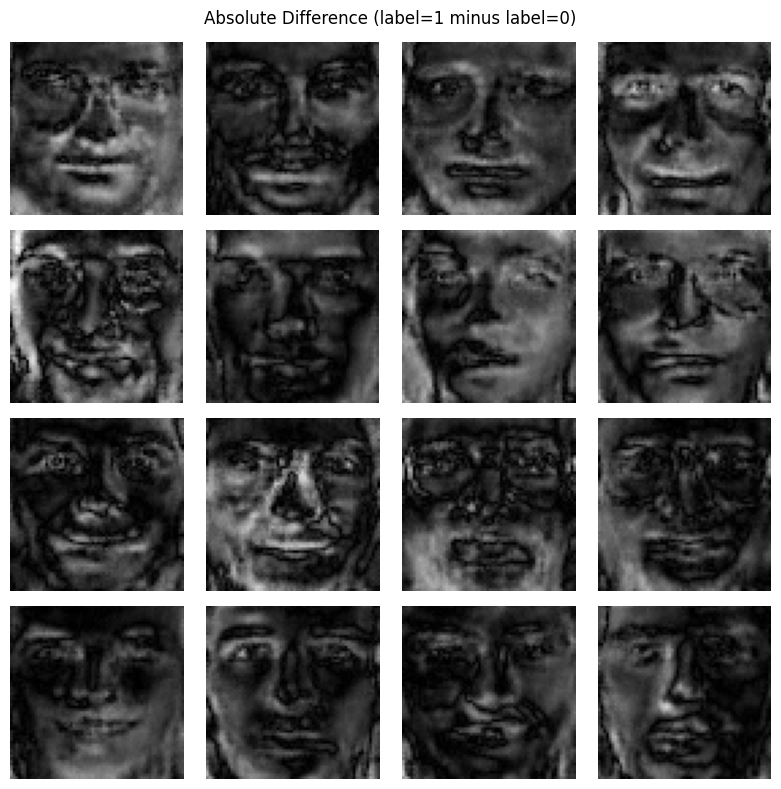

[Epoch 650/650] D: 0.7354 | G: 2.1953 | elapsed: 449.1s


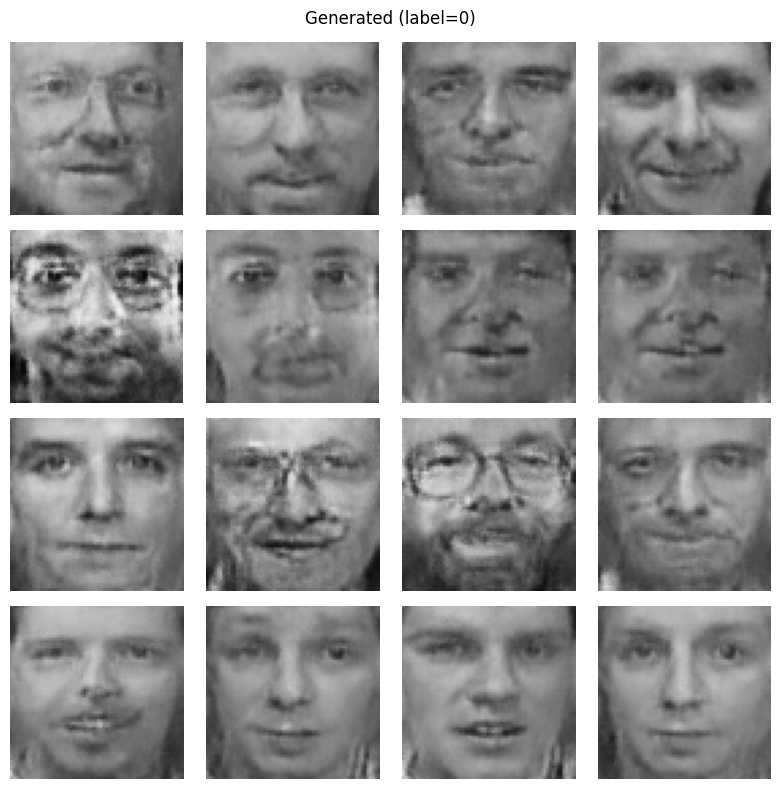

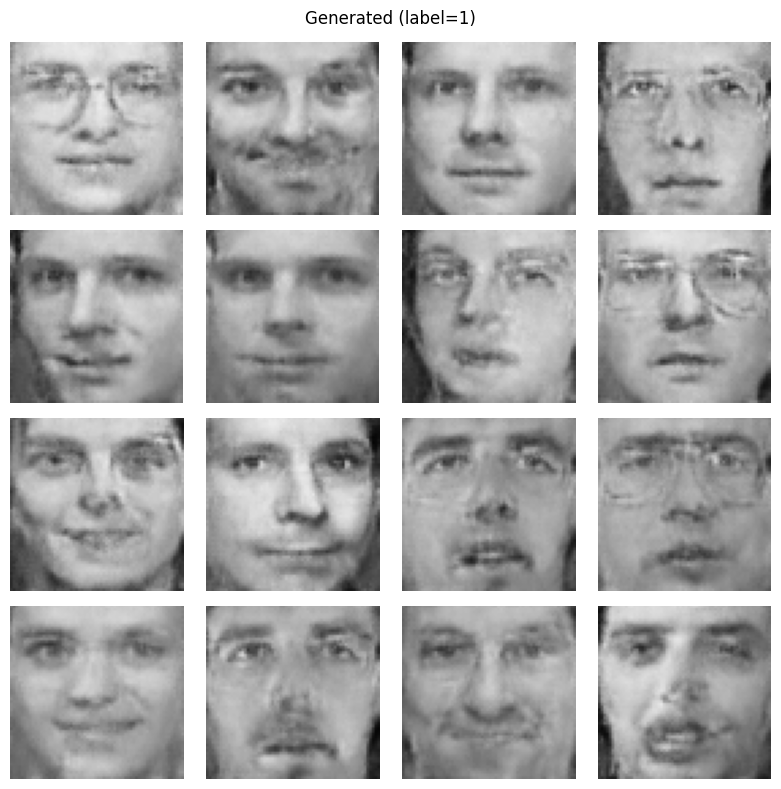

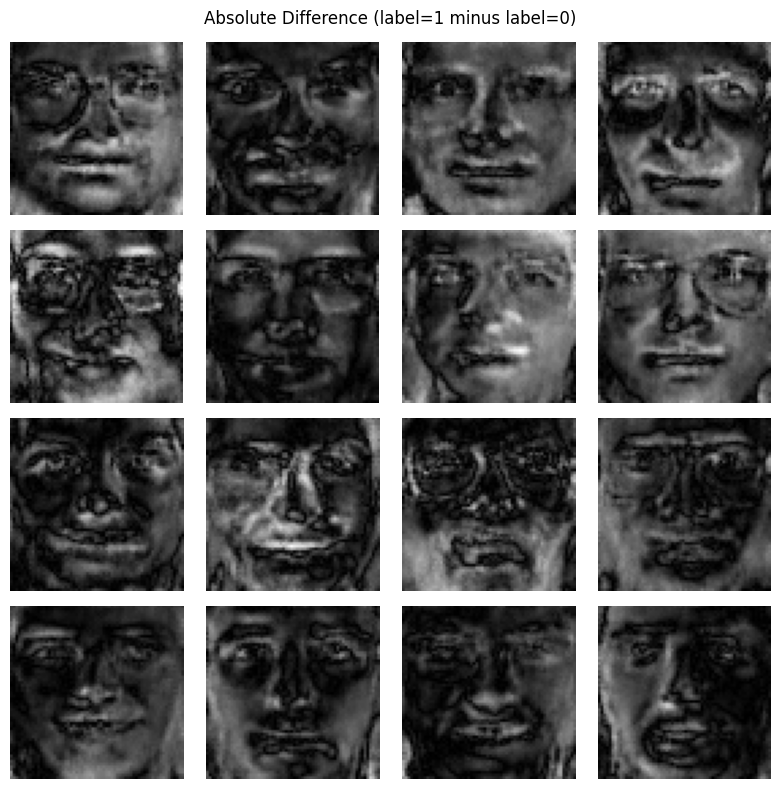


✅ Training complete.
Samples saved to: /content/cgan_faces_out


In [ ]:

# cGAN) for grayscale faces with a binary attribute (e.g., smiling vs not)
# Works with a custom folder+CSV or falls back to Olivetti faces.
# - Generator & Discriminator are both conditioned on the label
# - Trains briefly (tunable)
# - Visualizes label-0 vs label-1 generations for the same noise plus their difference map

import os, math, time, random, sys
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import layers, Model, optimizers
from tensorflow.keras import backend as K

# --------------------------
# Config
# --------------------------
class CFG:
    # --- Data ---
    USE_CUSTOM_DATASET = False  # ← set True to use your folder+CSV
    IMG_DIR = r"./faces_gray_64"  # folder of images for custom dataset
    CSV_PATH = r"./labels.csv"    # CSV with columns: filename,label  (label in {0,1})
    IMG_H, IMG_W, IMG_C = 1024, 1024, 1  # grayscale
    VAL_SPLIT = 0.0  # we don't need validation for GAN; keep all for train
    # --- Training ---
    Z_DIM = 100
    BATCH = 30
    EPOCHS = 650             # increase for better results (e.g., 100+)
    LR_D = 1e-4
    LR_G = 1e-4
    BETA1 = 0.5
    BETA2 = 0.999
    BUFFER = 1024
    # --- Visualization ---
    SAMPLE_N = 16           # show a grid of N samples (must be a square number)
    SAVE_DIR = "./cgan_faces_out"
    SEED = 42

# Reproducibility
os.makedirs(CFG.SAVE_DIR, exist_ok=True)
random.seed(CFG.SEED); np.random.seed(CFG.SEED); tf.random.set_seed(CFG.SEED)
tf.get_logger().setLevel("ERROR")

print("TensorFlow:", tf.version)
print("GPU:", tf.config.list_physical_devices('GPU'))

# --------------------------
# Data loading helpers
# --------------------------
def _load_custom_df(img_dir, csv_path):
    import pandas as pd
    df = pd.read_csv(csv_path)
    # expected columns: filename,label
    if not {'filename','label'}.issubset(set(df.columns)):
        raise ValueError("CSV must contain columns: 'filename' and 'label'")
    # absolute paths
    df['path'] = df['filename'].apply(lambda x: os.path.join(img_dir, x))
    # ensure existence
    missing = df[~df['path'].apply(os.path.exists)]
    if len(missing):
        raise FileNotFoundError(f"{len(missing)} files listed in CSV not found under {img_dir}. Example: {missing.iloc[0]['path']}")
    # labels to int {0,1}
    df['label'] = df['label'].astype(int)
    return df[['path','label']].reset_index(drop=True)

def _tf_load_image(path, label):
    img_raw = tf.io.read_file(path)
    img = tf.io.decode_image(img_raw, channels=1, expand_animations=False)
    img = tf.image.resize(img, [CFG.IMG_H, CFG.IMG_W], method=tf.image.ResizeMethod.BILINEAR)
    img = tf.cast(img, tf.float32) / 127.5 - 1.0  # [-1,1]
    label = tf.cast(label, tf.int32)
    return img, label

def _make_dataset_from_custom(img_dir, csv_path):
    df = _load_custom_df(img_dir, csv_path)
    paths = df['path'].values
    labels = df['label'].values
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.shuffle(min(len(paths), CFG.BUFFER), seed=CFG.SEED, reshuffle_each_iteration=True)
    ds = ds.map(lambda p, y: _tf_load_image(p, y), num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(CFG.BATCH, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
    return ds, len(df)

def _make_dataset_olivetti():
    # Fallback: sklearn Olivetti faces (64x64 grayscale), derive a simple binary attribute
    try:
        from sklearn.datasets import fetch_olivetti_faces
    except Exception as e:
        raise RuntimeError("scikit-learn not available. Install scikit-learn or switch to USE_CUSTOM_DATASET=True") from e
    data = fetch_olivetti_faces()
    imgs = data.images.astype(np.float32)  # [0,1], shape: (400, 64, 64)
    # derive a naive binary attribute: label=1 if image average brightness > median
    means = imgs.reshape(len(imgs), -1).mean(axis=1)
    thr = np.median(means)
    labels = (means > thr).astype(np.int32)

    # to [-1,1] and add channel
    imgs = imgs * 2.0 - 1.0
    imgs = np.expand_dims(imgs, -1).astype(np.float32)

    ds = tf.data.Dataset.from_tensor_slices((imgs, labels))
    ds = ds.shuffle(min(len(imgs), CFG.BUFFER), seed=CFG.SEED, reshuffle_each_iteration=True)
    ds = ds.batch(CFG.BATCH, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
    return ds, len(imgs)

if CFG.USE_CUSTOM_DATASET:
    print("📂 Using custom dataset...")
    ds_train, N_SAMPLES = _make_dataset_from_custom(CFG.IMG_DIR, CFG.CSV_PATH)
else:
    print("🧪 Using Olivetti faces fallback (+ synthetic binary attribute)...")
    ds_train, N_SAMPLES = _make_dataset_olivetti()

steps_per_epoch = max(1, N_SAMPLES // CFG.BATCH)
print(f"Samples: {N_SAMPLES} | Batch: {CFG.BATCH} | Steps/Epoch: {steps_per_epoch}")

# --------------------------
# Model: Conditional Generator & Discriminator
# --------------------------
def build_generator(z_dim=CFG.Z_DIM, img_shape=(CFG.IMG_H, CFG.IMG_W, CFG.IMG_C)):
    # Inputs
    z_in = layers.Input(shape=(z_dim,), name="z")
    y_in = layers.Input(shape=(), dtype='int32', name="y")  # scalar {0,1}

    # Embed label and fuse with noise (Hadamard product after projection)
    ly = layers.Embedding(input_dim=2, output_dim=z_dim)(y_in)           # (None, z_dim)
    ly = layers.Flatten()(ly)
    h  = layers.Multiply()([z_in, ly])                                   # condition noise

    # Project and reshape to small spatial map
    x = layers.Dense(8*8*256, use_bias=False)(h)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)
    x = layers.Reshape((8, 8, 256))(x)

    # Upsampling stack to 64x64x1
    x = layers.Conv2DTranspose(128, 4, strides=2, padding="same", use_bias=False)(x)  # 16x16
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, 4, strides=2, padding="same", use_bias=False)(x)   # 32x32
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(32, 4, strides=2, padding="same", use_bias=False)(x)   # 64x64
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    out = layers.Conv2D(1, kernel_size=3, padding="same", activation="tanh")(x)

    return Model([z_in, y_in], out, name="Generator")

def build_discriminator(img_shape=(CFG.IMG_H, CFG.IMG_W, CFG.IMG_C)):
    x_in = layers.Input(shape=img_shape, name="x")
    y_in = layers.Input(shape=(), dtype='int32', name="y")

    # Turn scalar y into a (H,W,1) mask and concat as a channel (conditioning)
    ly = layers.Embedding(input_dim=2, output_dim=CFG.IMG_H*CFG.IMG_W)(y_in)  # (None, H*W)
    ly = layers.Reshape((CFG.IMG_H, CFG.IMG_W, 1))(ly)
    xy = layers.Concatenate(axis=-1)([x_in, ly])  # -> (H,W,2)

    # Downsampling conv stack
    def conv_block(x, c, stride):
        x = layers.Conv2D(c, 4, stride, "same", use_bias=False)(x)
        x = layers.LeakyReLU(0.2)(x)
        return x

    x = conv_block(xy, 64, 2)   # 32x32
    x = conv_block(x, 128, 2)   # 16x16
    x = conv_block(x, 256, 2)   # 8x8
    x = conv_block(x, 512, 2)   # 4x4

    x = layers.Flatten()(x)
    x = layers.Dropout(0.3)(x)
    out = layers.Dense(1, activation="sigmoid")(x)

    return Model([x_in, y_in], out, name="Discriminator")

G = build_generator()
D = build_discriminator()
D_opt = optimizers.Adam(CFG.LR_D, beta_1=CFG.BETA1, beta_2=CFG.BETA2)
G_opt = optimizers.Adam(CFG.LR_G, beta_1=CFG.BETA1, beta_2=CFG.BETA2)
bce = tf.keras.losses.BinaryCrossentropy(from_logits=False)

# --------------------------
# Training step (tf.function)
# --------------------------
@tf.function
def train_step(real_imgs, labels):
    bs = tf.shape(real_imgs)[0]
    z = tf.random.normal(shape=(bs, CFG.Z_DIM))

    # ----- Train Discriminator -----
    with tf.GradientTape() as tape_d:
        fake_imgs = G([z, labels], training=True)
        logits_real = D([real_imgs, labels], training=True)
        logits_fake = D([fake_imgs, labels], training=True)

        # d_loss_real = bce(tf.ones_like(logits_real), logits_real)
        # d_loss_fake = bce(tf.zeros_like(logits_fake), logits_fake)
        real_labels = tf.ones_like(logits_real) * 0.9  # smooth positive labels
        fake_labels = tf.zeros_like(logits_fake) + 0.1 # slightly offset zeros
        d_loss_real = bce(real_labels, logits_real)
        d_loss_fake = bce(fake_labels, logits_fake)

        d_loss = d_loss_real + d_loss_fake

        grads_d = tape_d.gradient(d_loss, D.trainable_variables)
    D_opt.apply_gradients(zip(grads_d, D.trainable_variables))

    # ----- Train Generator -----
    z2 = tf.random.normal(shape=(bs, CFG.Z_DIM))
    with tf.GradientTape() as tape_g:
        fake_imgs2 = G([z2, labels], training=True)
        logits_fake2 = D([fake_imgs2, labels], training=True)
        g_loss = bce(tf.ones_like(logits_fake2), logits_fake2)

    grads_g = tape_g.gradient(g_loss, G.trainable_variables)
    G_opt.apply_gradients(zip(grads_g, G.trainable_variables))

    return d_loss, g_loss

# --------------------------
# Fixed test noise for visualization
# --------------------------
grid_n = CFG.SAMPLE_N
assert int(math.sqrt(grid_n))**2 == grid_n, "SAMPLE_N must be a perfect square (e.g., 16, 25, 36)."
fixed_z = tf.random.normal((grid_n, CFG.Z_DIM))

def make_label_batch(val, n):
    return tf.constant([val]*n, dtype=tf.int32)

def plot_grid(imgs, title, fname=None, vmin=-1, vmax=1):
    imgs = imgs.numpy()
    s = int(math.sqrt(len(imgs)))
    fig, axes = plt.subplots(s, s, figsize=(s*2, s*2))
    k = 0
    for i in range(s):
        for j in range(s):
            ax = axes[i, j]
            ax.imshow(np.squeeze(imgs[k]), cmap='gray', vmin=vmin, vmax=vmax)
            ax.axis('off')
            k += 1
    plt.suptitle(title)
    plt.tight_layout()
    if fname:
        plt.savefig(fname, dpi=120, bbox_inches='tight')
    plt.show()

def generate_and_compare():
    # same noise, two labels
    y0 = make_label_batch(0, grid_n)
    y1 = make_label_batch(1, grid_n)
    g0 = G([fixed_z, y0], training=False)
    g1 = G([fixed_z, y1], training=False)
    diff = tf.abs(g1 - g0)

    plot_grid(g0, "Generated (label=0)", os.path.join(CFG.SAVE_DIR, "gen_label0.png"))
    plot_grid(g1, "Generated (label=1)", os.path.join(CFG.SAVE_DIR, "gen_label1.png"))
    # For difference, scale to [0,1] for visualization
    plot_grid((diff - tf.reduce_min(diff))/(tf.reduce_max(diff)-tf.reduce_min(diff)+1e-8),
              "Absolute Difference (label=1 minus label=0)",
              os.path.join(CFG.SAVE_DIR, "gen_diff.png"), vmin=0, vmax=1)

# --------------------------
# Train
# --------------------------
print("\n🚀 Training...")
t0 = time.time()
step_global = 0
for epoch in range(1, CFG.EPOCHS+1):
    d_meter, g_meter, n_batches = 0.0, 0.0, 0
    for real_imgs, labels in ds_train:
        d_loss, g_loss = train_step(real_imgs, labels)
        d_meter += float(d_loss); g_meter += float(g_loss); n_batches += 1
        step_global += 1
    d_meter /= max(1, n_batches); g_meter /= max(1, n_batches)

    if epoch % max(1, CFG.EPOCHS//10) == 0 or epoch <= 3 or epoch == CFG.EPOCHS:
        print(f"[Epoch {epoch:03d}/{CFG.EPOCHS}] D: {d_meter:.4f} | G: {g_meter:.4f} | elapsed: {time.time()-t0:.1f}s")
        generate_and_compare()

print("\n✅ Training complete.")
print(f"Samples saved to: {os.path.abspath(CFG.SAVE_DIR)}")

# --------------------------
# On-demand generation utility
# --------------------------
def generate_faces(label_value=0, n=16):
    """Generate n faces for a chosen label (0 or 1) and display as a grid."""
    z = tf.random.normal((n, CFG.Z_DIM))
    y = make_label_batch(int(label_value), n)
    imgs = G([z, y], training=False)
    plot_grid(imgs, f"Generated faces (label={label_value})")

# Example: uncomment to generate extra samples after training
# generate_faces(0, 16)
# generate_faces(1, 16)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [1]:
# cgan_improved.py
# Improved Conditional GAN for grayscale faces (64x64) with practical training fixes.
# - UpSampling + Conv2D in generator (less checkerboard artifacts)
# - Label smoothing, minor label flipping (noisy labels)
# - Train discriminator multiple times per generator step
# - Optional spectral normalization (if tensorflow_addons available)
# - Save samples & checkpoints
# - Works with custom folder+CSV or falls back to Olivetti faces
#
# Run: python cgan_improved.py

import os, math, time, random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Model, optimizers
from tensorflow.keras import backend as K

# --------------------------
# Config
# --------------------------
class CFG:
    # --- Data ---
    USE_CUSTOM_DATASET = False  # set True to use custom folder + CSV
    IMG_DIR = r"./faces_gray_64"  # folder of images for custom dataset
    CSV_PATH = r"./labels.csv"    # CSV with columns: filename,label (label in {0,1})
    IMG_H, IMG_W, IMG_C = 64, 64, 1  # grayscale
    VAL_SPLIT = 0.0

    # --- Training ---
    Z_DIM = 100
    BATCH = 32          # reduced batch for better BatchNorm behavior
    EPOCHS = 1500       # increase for better results
    LR_D = 1e-4
    LR_G = 1e-4
    BETA1 = 0.5
    BETA2 = 0.999
    BUFFER = 1024
    D_STEPS = 2         # number of discriminator updates per generator update
    LABEL_SMOOTH = 0.9  # positive label smoothing
    FLIP_PROB = 0.03    # probability to flip labels for noise
    # --- Visualization ---
    SAMPLE_N = 16       # must be perfect square
    SAVE_DIR = "./cgan_faces_out"
    SEED = 42
    CHECKPOINT_EVERY = 50

# Reproducibility
os.makedirs(CFG.SAVE_DIR, exist_ok=True)
random.seed(CFG.SEED); np.random.seed(CFG.SEED); tf.random.set_seed(CFG.SEED)
tf.get_logger().setLevel("ERROR")

print("TensorFlow:", tf.__version__)
print("GPU:", tf.config.list_physical_devices('GPU'))

# --------------------------
# Data loading helpers
# --------------------------
def _load_custom_df(img_dir, csv_path):
    import pandas as pd
    df = pd.read_csv(csv_path)
    if not {'filename','label'}.issubset(set(df.columns)):
        raise ValueError("CSV must contain columns: 'filename' and 'label'")
    df['path'] = df['filename'].apply(lambda x: os.path.join(img_dir, x))
    missing = df[~df['path'].apply(os.path.exists)]
    if len(missing):
        raise FileNotFoundError(f"{len(missing)} files listed in CSV not found under {img_dir}. Example: {missing.iloc[0]['path']}")
    df['label'] = df['label'].astype(int)
    return df[['path','label']].reset_index(drop=True)

def _tf_load_image(path, label):
    img_raw = tf.io.read_file(path)
    img = tf.io.decode_image(img_raw, channels=1, expand_animations=False)
    img = tf.image.resize(img, [CFG.IMG_H, CFG.IMG_W], method=tf.image.ResizeMethod.BILINEAR)
    img = tf.cast(img, tf.float32) / 127.5 - 1.0  # [-1,1]
    label = tf.cast(label, tf.int32)
    return img, label

def _make_dataset_from_custom(img_dir, csv_path):
    df = _load_custom_df(img_dir, csv_path)
    paths = df['path'].values
    labels = df['label'].values
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.shuffle(min(len(paths), CFG.BUFFER), seed=CFG.SEED, reshuffle_each_iteration=True)
    ds = ds.map(lambda p, y: _tf_load_image(p, y), num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(CFG.BATCH, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
    return ds, len(df)

def _make_dataset_olivetti():
    try:
        from sklearn.datasets import fetch_olivetti_faces
    except Exception as e:
        raise RuntimeError("scikit-learn not available. Install scikit-learn or set USE_CUSTOM_DATASET=True") from e
    data = fetch_olivetti_faces()
    imgs = data.images.astype(np.float32)  # [0,1], shape: (400, 64, 64)
    means = imgs.reshape(len(imgs), -1).mean(axis=1)
    thr = np.median(means)
    labels = (means > thr).astype(np.int32)
    imgs = imgs * 2.0 - 1.0
    imgs = np.expand_dims(imgs, -1).astype(np.float32)
    ds = tf.data.Dataset.from_tensor_slices((imgs, labels))
    ds = ds.shuffle(min(len(imgs), CFG.BUFFER), seed=CFG.SEED, reshuffle_each_iteration=True)
    ds = ds.batch(CFG.BATCH, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
    return ds, len(imgs)

if CFG.USE_CUSTOM_DATASET:
    print("📂 Using custom dataset...")
    ds_train, N_SAMPLES = _make_dataset_from_custom(CFG.IMG_DIR, CFG.CSV_PATH)
else:
    print("🧪 Using Olivetti faces fallback (+ synthetic binary attribute)...")
    ds_train, N_SAMPLES = _make_dataset_olivetti()

steps_per_epoch = max(1, N_SAMPLES // CFG.BATCH)
print(f"Samples: {N_SAMPLES} | Batch: {CFG.BATCH} | Steps/Epoch: {steps_per_epoch}")

# --------------------------
# Spectral norm (optional)
# --------------------------
use_spectral = False
try:
    import tensorflow_addons as tfa
    SpectralNormalization = tfa.layers.SpectralNormalization
    use_spectral = True
    print("Using tensorflow_addons.SpectralNormalization (optional).")
except Exception:
    print("tensorflow_addons not available; continuing without spectral normalization (optional).")

# --------------------------
# Model: Conditional Generator & Discriminator (improved)
# --------------------------
def sn_conv(x, filters, kernel_size, strides=1, padding='same', use_bias=False):
    # helper: conv with optional spectral norm
    conv = layers.Conv2D(filters, kernel_size, strides=strides, padding=padding, use_bias=use_bias)
    if use_spectral:
        return SpectralNormalization(conv)(x)
    else:
        return conv(x)

def build_generator(z_dim=CFG.Z_DIM, img_shape=(CFG.IMG_H, CFG.IMG_W, CFG.IMG_C)):
    z_in = layers.Input(shape=(z_dim,), name="z")
    y_in = layers.Input(shape=(), dtype='int32', name="y")
    ly = layers.Embedding(input_dim=2, output_dim=z_dim)(y_in)
    ly = layers.Flatten()(ly)
    h  = layers.Multiply()([z_in, ly])

    x = layers.Dense(8*8*512, use_bias=False)(h)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)
    x = layers.Reshape((8, 8, 512))(x)

    # Upsample blocks (Upsampling + Conv2D)
    def up_block(x, filters):
        x = layers.UpSampling2D()(x)  # double spatial dims
        x = layers.Conv2D(filters, 3, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        return x

    x = up_block(x, 256)  # 16x16
    x = up_block(x, 128)  # 32x32
    x = up_block(x, 64)   # 64x64

    out = layers.Conv2D(1, kernel_size=3, padding="same", activation="tanh")(x)
    return Model([z_in, y_in], out, name="Generator")

def build_discriminator(img_shape=(CFG.IMG_H, CFG.IMG_W, CFG.IMG_C)):
    x_in = layers.Input(shape=img_shape, name="x")
    y_in = layers.Input(shape=(), dtype='int32', name="y")

    ly = layers.Embedding(input_dim=2, output_dim=CFG.IMG_H*CFG.IMG_W)(y_in)
    ly = layers.Reshape((CFG.IMG_H, CFG.IMG_W, 1))(ly)
    xy = layers.Concatenate(axis=-1)([x_in, ly])  # (H,W,2)

    def conv_block(x, c, stride):
        if use_spectral:
            # apply spectral norm to conv
            conv = layers.Conv2D(c, 4, stride, "same", use_bias=False)
            x = SpectralNormalization(conv)(x)
            x = layers.LeakyReLU(0.2)(x)
            return x
        else:
            x = layers.Conv2D(c, 4, stride, "same", use_bias=False)(x)
            x = layers.LeakyReLU(0.2)(x)
            return x

    x = conv_block(xy, 64, 2)   # 32x32
    x = conv_block(x, 128, 2)   # 16x16
    x = conv_block(x, 256, 2)   # 8x8
    x = conv_block(x, 512, 2)   # 4x4

    x = layers.Flatten()(x)
    x = layers.Dropout(0.3)(x)
    out = layers.Dense(1, activation="sigmoid")(x)

    return Model([x_in, y_in], out, name="Discriminator")

G = build_generator()
D = build_discriminator()
D_opt = optimizers.Adam(CFG.LR_D, beta_1=CFG.BETA1, beta_2=CFG.BETA2)
G_opt = optimizers.Adam(CFG.LR_G, beta_1=CFG.BETA1, beta_2=CFG.BETA2)
bce = tf.keras.losses.BinaryCrossentropy(from_logits=False)

# --------------------------
# Training step functions
# --------------------------
@tf.function
def d_train_step(real_imgs, labels):
    # Train discriminator on real + fake (single D step)
    bs = tf.shape(real_imgs)[0]
    z = tf.random.normal(shape=(bs, CFG.Z_DIM))
    with tf.GradientTape() as tape:
        fake_imgs = G([z, labels], training=True)
        logits_real = D([real_imgs, labels], training=True)
        logits_fake = D([fake_imgs, labels], training=True)

        # label smoothing + small noise
        real_labels = tf.ones_like(logits_real) * CFG.LABEL_SMOOTH
        fake_labels = tf.zeros_like(logits_fake)
        # occasional flipping for robustness
        flip_mask = tf.random.uniform(shape=()) < CFG.FLIP_PROB
        real_labels = tf.cond(flip_mask, lambda: 1.0 - real_labels, lambda: real_labels)
        # compute losses
        d_loss_real = bce(real_labels, logits_real)
        d_loss_fake = bce(fake_labels, logits_fake)
        d_loss = d_loss_real + d_loss_fake

    grads_d = tape.gradient(d_loss, D.trainable_variables)
    D_opt.apply_gradients(zip(grads_d, D.trainable_variables))
    return d_loss

@tf.function
def g_train_step(labels):
    # Train generator to fool discriminator
    bs = tf.shape(labels)[0]
    z = tf.random.normal(shape=(bs, CFG.Z_DIM))
    with tf.GradientTape() as tape:
        fake_imgs = G([z, labels], training=True)
        logits_fake = D([fake_imgs, labels], training=True)
        # try to make D predict real (use smoothed ones to help)
        g_target = tf.ones_like(logits_fake) * CFG.LABEL_SMOOTH
        g_loss = bce(g_target, logits_fake)

    grads_g = tape.gradient(g_loss, G.trainable_variables)
    G_opt.apply_gradients(zip(grads_g, G.trainable_variables))
    return g_loss

# --------------------------
# Fixed test noise for visualization
# --------------------------
grid_n = CFG.SAMPLE_N
assert int(math.sqrt(grid_n))**2 == grid_n, "SAMPLE_N must be a perfect square (e.g., 16, 25, 36)."
fixed_z = tf.random.normal((grid_n, CFG.Z_DIM))

def make_label_batch(val, n):
    return tf.constant([val]*n, dtype=tf.int32)

def plot_grid(imgs, title, fname=None, vmin=-1, vmax=1, show=False):
    imgs = imgs.numpy()
    s = int(math.sqrt(len(imgs)))
    fig, axes = plt.subplots(s, s, figsize=(s*2, s*2))
    k = 0
    for i in range(s):
        for j in range(s):
            ax = axes[i, j]
            ax.imshow(np.squeeze(imgs[k]), cmap='gray', vmin=vmin, vmax=vmax)
            ax.axis('off')
            k += 1
    plt.suptitle(title)
    plt.tight_layout()
    if fname:
        plt.savefig(fname, dpi=120, bbox_inches='tight')
    if show:
        plt.show()
    plt.close(fig)

def generate_and_compare(epoch=None):
    y0 = make_label_batch(0, grid_n)
    y1 = make_label_batch(1, grid_n)
    g0 = G([fixed_z, y0], training=False)
    g1 = G([fixed_z, y1], training=False)
    diff = tf.abs(g1 - g0)

    fname0 = os.path.join(CFG.SAVE_DIR, f"gen_label0_epoch{epoch or 'final'}.png")
    fname1 = os.path.join(CFG.SAVE_DIR, f"gen_label1_epoch{epoch or 'final'}.png")
    fn_diff = os.path.join(CFG.SAVE_DIR, f"gen_diff_epoch{epoch or 'final'}.png")

    plot_grid(g0, f"Generated (label=0) epoch {epoch}", fname0)
    plot_grid(g1, f"Generated (label=1) epoch {epoch}", fname1)
    scaled = (diff - tf.reduce_min(diff)) / (tf.reduce_max(diff) - tf.reduce_min(diff) + 1e-8)
    plot_grid(scaled, f"Absolute Difference (label=1 - label=0) epoch {epoch}", fn_diff, vmin=0, vmax=1)
    return fname0, fname1, fn_diff

# --------------------------
# Check scaling quickly
# --------------------------
def print_minmax(real_imgs, fake_imgs):
    try:
        rmin = float(tf.reduce_min(real_imgs).numpy())
        rmax = float(tf.reduce_max(real_imgs).numpy())
        fmin = float(tf.reduce_min(fake_imgs).numpy())
        fmax = float(tf.reduce_max(fake_imgs).numpy())
        print(f"Real min/max: {rmin:.3f}/{rmax:.3f} | Fake min/max: {fmin:.3f}/{fmax:.3f}")
    except Exception:
        pass

# --------------------------
# Checkpoints
# --------------------------
ckpt_dir = os.path.join(CFG.SAVE_DIR, "checkpoints")
os.makedirs(ckpt_dir, exist_ok=True)
ckpt = tf.train.Checkpoint(generator=G, discriminator=D, g_opt=G_opt, d_opt=D_opt)
ckpt_manager = tf.train.CheckpointManager(ckpt, ckpt_dir, max_to_keep=3)

# --------------------------
# Train
# --------------------------
print("\n🚀 Training...")
t0 = time.time()
step_global = 0
for epoch in range(1, CFG.EPOCHS+1):
    d_meter, g_meter, n_batches = 0.0, 0.0, 0
    for real_imgs, labels in ds_train:
        # Train discriminator D_STEPS times
        for _ in range(CFG.D_STEPS):
            d_loss = d_train_step(real_imgs, labels)
        # Then train generator once
        g_loss = g_train_step(labels)

        d_meter += float(d_loss); g_meter += float(g_loss); n_batches += 1
        step_global += 1

    d_meter /= max(1, n_batches); g_meter /= max(1, n_batches)

    if epoch % max(1, CFG.EPOCHS//10) == 0 or epoch <= 5 or epoch == CFG.EPOCHS:
        print(f"[Epoch {epoch:03d}/{CFG.EPOCHS}] D: {d_meter:.4f} | G: {g_meter:.4f} | elapsed: {time.time()-t0:.1f}s")
        # quick sanity generate and print min/max
        # use small batch to inspect
        y0 = make_label_batch(0, grid_n)
        fake_sample = G([fixed_z, y0], training=False)
        # get a real batch to compare if available
        try:
            real_sample_batch = next(iter(ds_train.take(1)))[0]
            print_minmax(real_sample_batch[:grid_n], fake_sample)
        except Exception:
            pass
        generate_and_compare(epoch)
        # save checkpoint periodically
        if epoch % CFG.CHECKPOINT_EVERY == 0:
            ckpt_manager.save()
            print(f"Checkpoint saved at epoch {epoch}.")

print("\n✅ Training complete.")
print(f"Samples saved to: {os.path.abspath(CFG.SAVE_DIR)}")
ckpt_manager.save()

# --------------------------
# On-demand generation utility
# --------------------------
def generate_faces(label_value=0, n=16, fname=None):
    z = tf.random.normal((n, CFG.Z_DIM))
    y = make_label_batch(int(label_value), n)
    imgs = G([z, y], training=False)
    if fname is None:
        fname = os.path.join(CFG.SAVE_DIR, f"gen_label{label_value}_custom.png")
    plot_grid(imgs, f"Generated faces (label={label_value})", fname)
    print(f"Saved: {fname}")

# Example usage after training:
# generate_faces(0, 16)
# generate_faces(1, 16)


TensorFlow: 2.19.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
🧪 Using Olivetti faces fallback (+ synthetic binary attribute)...
Samples: 400 | Batch: 32 | Steps/Epoch: 12
tensorflow_addons not available; continuing without spectral normalization (optional).

🚀 Training...
[Epoch 001/1500] D: 1.1145 | G: 1.3501 | elapsed: 12.5s
Real min/max: -0.992/0.942 | Fake min/max: -0.006/0.349
[Epoch 002/1500] D: 0.9597 | G: 1.6547 | elapsed: 15.3s
Real min/max: -0.959/1.000 | Fake min/max: -0.129/0.407
[Epoch 003/1500] D: 1.0110 | G: 1.9237 | elapsed: 18.6s
Real min/max: -0.942/0.934 | Fake min/max: -0.288/0.469
[Epoch 004/1500] D: 0.8590 | G: 1.6293 | elapsed: 21.2s
Real min/max: -0.967/0.917 | Fake min/max: -0.559/0.420
[Epoch 005/1500] D: 1.0965 | G: 1.6042 | elapsed: 24.0s
Real min/max: -0.992/0.934 | Fake min/max: -0.652/0.426
[Epoch 150/1500] D: 0.6964 | G: 1.8575 | elapsed: 252.7s
Real min/max: -0.992/0.934 | Fake min/max: -0.988/0.783
Checkpoint saved at epoch